## EN3160 Assignment 1 on Intensity Transformations and Neighborhood Filtering

### Q1

In [318]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [319]:
#Import image
ew = cv.imread('a1images/emma.jpg', cv.IMREAD_GRAYSCALE)
assert ew is not None

256


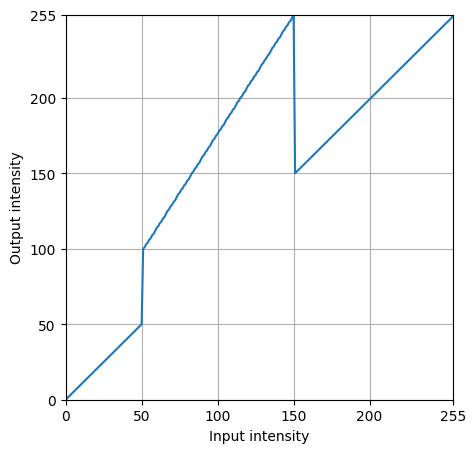

In [320]:
#Define Transformation Function
t1 = np.linspace(0, 50, 51).astype('uint8')
t2 = np.linspace(100, 255, 100).astype('uint8')
t3 = np.linspace(150, 255, 105).astype('uint8')

transform = np.concatenate((t1, t2, t3), axis=0).astype('uint8')
print(len(transform))

# Plot the figure
plt.figure(figsize=(5, 5))
plt.plot(transform)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.xticks([0, 50, 100, 150, 200, 255])
plt.ylim(0, 255)
plt.yticks([0, 50, 100, 150, 200, 255])
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()


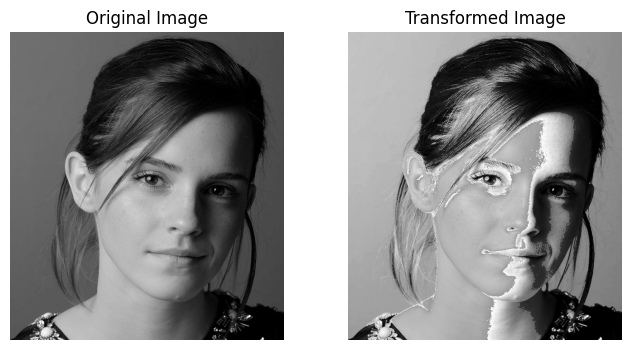

In [321]:
# Implement the transformation
ew_transformed = transform[ew]

# Plot the original and transformed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(ew, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Image')
ax[0].axis('off')
ax[1].imshow(ew_transformed, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Transformed Image')
ax[1].axis('off')
plt.show()

### Q2

### White Matter Approach 1

256


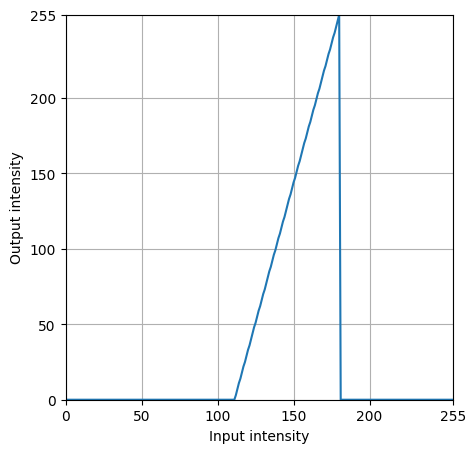

In [322]:
#Define Transformation Function
t1 = np.linspace(0, 0, 111).astype('uint8')
t2 = np.linspace(0, 255, 70).astype('uint8')
t3 = np.linspace(0, 0, 75).astype('uint8')

transform = np.concatenate((t1, t2, t3), axis=0).astype('uint8')
print(len(transform))

# Plot the figure
plt.figure(figsize=(5, 5))
plt.plot(transform)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.xticks([0, 50, 100, 150, 200, 255])
plt.ylim(0, 255)
plt.yticks([0, 50, 100, 150, 200, 255])
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()


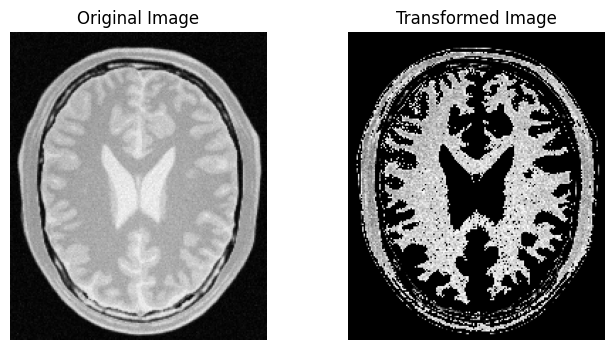

In [323]:
brain = cv.imread('a1images/brain_proton_density_slice.png', cv.IMREAD_GRAYSCALE)
assert brain is not None

# Implement the transformation
transformed_brain = transform[brain]

# Plot the original and transformed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(brain, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Image')
ax[0].axis('off')
ax[1].imshow(transformed_brain, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Transformed Image')
ax[1].axis('off')
plt.show()  

### Approach 2

256


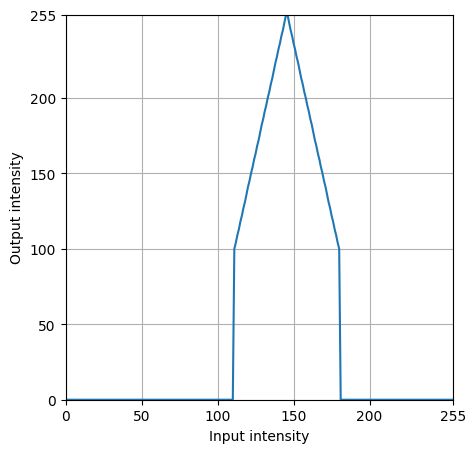

In [324]:
#Define Transformation Function
t1 = np.linspace(0, 0, 111).astype('uint8')
t2 = np.linspace(100, 255, 35).astype('uint8')
t3 = np.linspace(255, 100, 35).astype('uint8')
t4 = np.linspace(0, 0, 75).astype('uint8')

transform1 = np.concatenate((t1, t2, t3, t4), axis=0).astype('uint8')
print(len(transform))

# Plot the figure
plt.figure(figsize=(5, 5))
plt.plot(transform1)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.xticks([0, 50, 100, 150, 200, 255])
plt.ylim(0, 255)
plt.yticks([0, 50, 100, 150, 200, 255])
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()

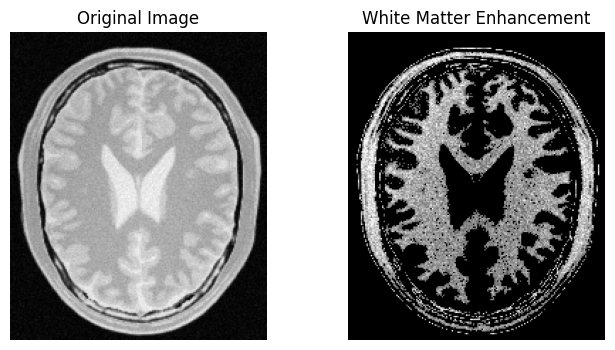

In [325]:
brain = cv.imread('a1images/brain_proton_density_slice.png', cv.IMREAD_GRAYSCALE)
assert brain is not None

# Implement the transformation
transformed_brain = transform1[brain]

# Plot the original and transformed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(brain, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Image')
ax[0].axis('off')
ax[1].imshow(transformed_brain, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('White Matter Enhancement')
ax[1].axis('off')
plt.show()  

### Gray Matter Approach

276


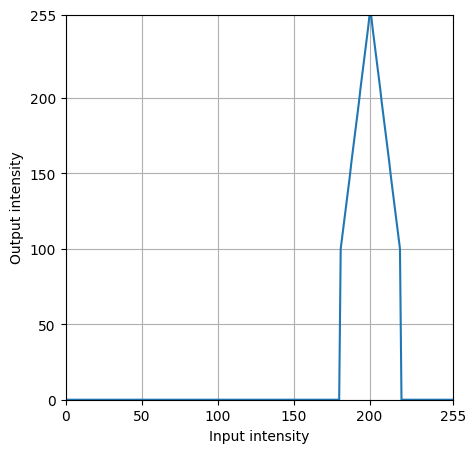

In [326]:
#Define Transformation Function
t21 = np.linspace(0, 0, 181).astype('uint8')
t22 = np.linspace(100, 255, 20).astype('uint8')
t23 = np.linspace(255, 100, 20).astype('uint8')
t24 = np.linspace(0, 0, 55).astype('uint8')

transform2 = np.concatenate((t21, t22, t23, t24), axis=0).astype('uint8')
print(len(transform2))

# Plot the figure
plt.figure(figsize=(5, 5))
plt.plot(transform2)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.xticks([0, 50, 100, 150, 200, 255])
plt.ylim(0, 255)
plt.yticks([0, 50, 100, 150, 200, 255])
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()

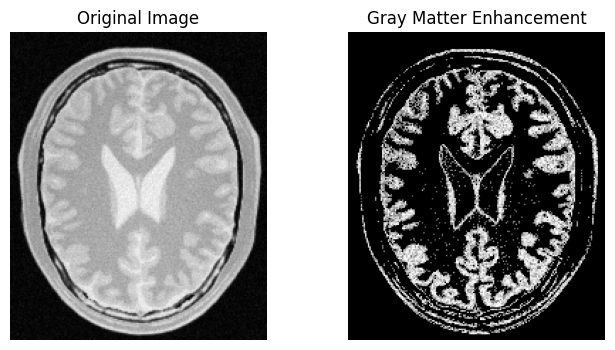

In [327]:
brain = cv.imread('a1images/brain_proton_density_slice.png', cv.IMREAD_GRAYSCALE)
assert brain is not None

# Implement the transformation
transformed_brain = transform2[brain]

# Plot the original and transformed images
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(brain, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Image')
ax[0].axis('off')
ax[1].imshow(transformed_brain, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Gray Matter Enhancement')
ax[1].axis('off')
plt.show()  

### Q3

In [328]:
# Load the image
img = cv.imread('a1images/highlights_and_shadows.jpg')
assert img is not None

# Convert to Lab color space
img_lab = cv.cvtColor(img, cv.COLOR_BGR2Lab)


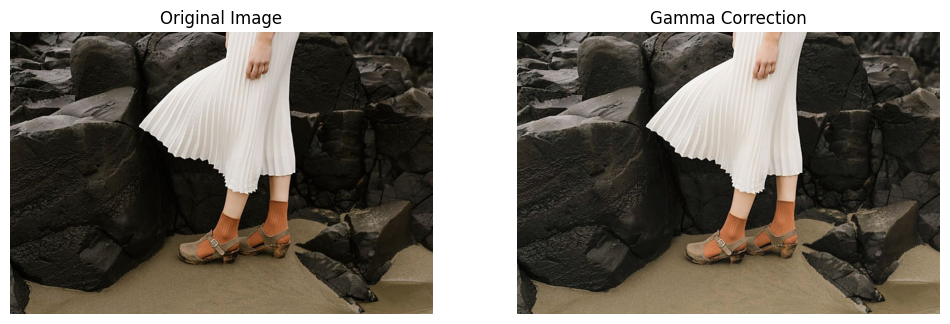

In [329]:
# split the Lab channels
L, a, b = cv.split(img_lab)

# Gamma correction
gamma = 0.8
t = np.array([(i/255.0)**(gamma)*255 for i in range(256)], dtype='uint8')

# Apply the transformation to the L channel
L_corrected = t[L]

# Merge the corrected L channel with the original a and b channels
img_lab_corrected = cv.merge((L_corrected, a, b))

# Plot the original and corrected images
fig, ax = plt.subplots(1, 2, figsize= (12, 8))
ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[1].imshow(cv.cvtColor(img_lab_corrected, cv.COLOR_Lab2RGB))
ax[1].set_title('Gamma Correction')
for a in ax:
    a.axis('off')

plt.show()


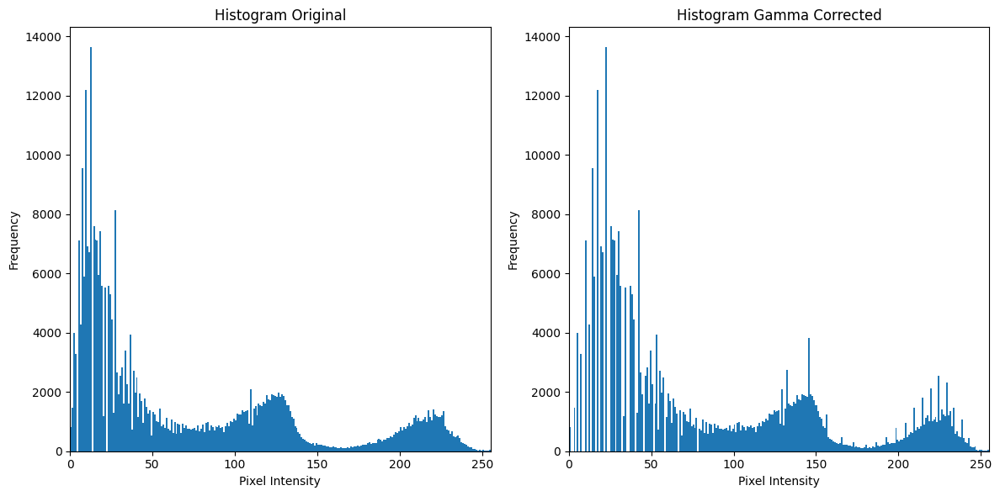

In [330]:
# calculate the histogram of the original image
hist_original, bins = np.histogram(L.ravel(), 256, [0,256])
# calculate the histogram of the corrected image
hist_gamma_corrected, bins = np.histogram(L_corrected.ravel(), 256, [0,256])

bin_centers = (bins[:-1] + bins[1:]) / 2

plt.figure(figsize=(12, 6))

# Original histogram
plt.subplot(1, 2, 1)
plt.bar(bin_centers, hist_original, width=1.0)
plt.title("Histogram Original")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.xlim(0, 255)

# Gamma corrected histogram
plt.subplot(1, 2, 2)
plt.bar(bin_centers, hist_gamma_corrected, width=1.0)
plt.title("Histogram Gamma Corrected")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.xlim(0, 255)

plt.tight_layout()
plt.show()

### Q4

In [331]:
# Load the image
spider = cv.imread('a1images/spider.png')
assert spider is not None

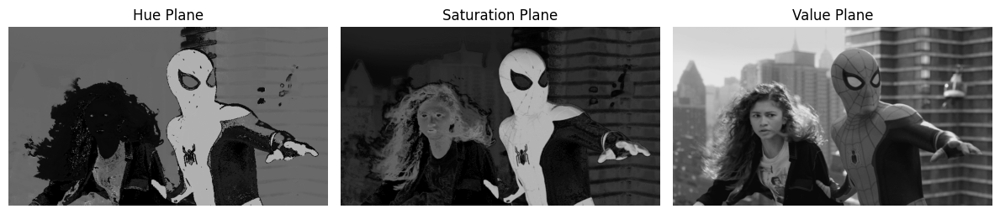

In [332]:
spider_rgb = cv.cvtColor(spider, cv.COLOR_BGR2RGB)
# Convert to HSV color space
spider_hsv = cv.cvtColor(spider, cv.COLOR_BGR2HSV)

# Split the HSV planes
h, s, v = cv.split(spider_hsv)

# Display the HSV channels
fig, ax = plt.subplots(1, 3, figsize=(12, 6))
ax[0].imshow(h, cmap='grey', vmin=0, vmax=255)
ax[0].set_title('Hue Plane')
ax[1].imshow(s, cmap='grey', vmin=0, vmax=255)
ax[1].set_title('Saturation Plane')
ax[2].imshow(v, cmap='grey', vmin=0, vmax=255)
ax[2].set_title('Value Plane')
for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()

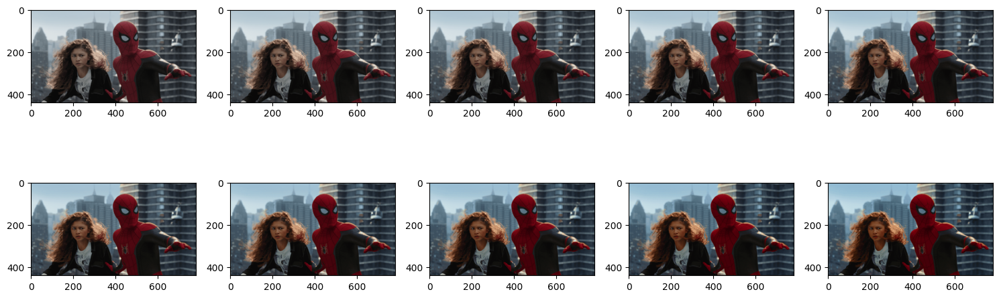

In [333]:
# Define the transformation function
a = np.arange(0, 1, 0.1)
sigma = 70

plt.figure(figsize=(15, 6))

x = np.arange(0, 256)
for idx, a_i in enumerate(a):
    f = np.minimum(x + a_i * 128 * np.exp(-((x - 128)**2) / (2 * sigma**2)), 255).astype('uint8')
    s_enhanced = f[s]
    spider_hsv_enhanced = cv.merge((h, s_enhanced, v))

    # Convert back to RGB color space
    spider_enhanced = cv.cvtColor(spider_hsv_enhanced, cv.COLOR_HSV2RGB)

    # Plot each enhanced image
    plt.subplot(2, 5, idx + 1)
    plt.imshow(spider_enhanced)

plt.tight_layout()
plt.show()

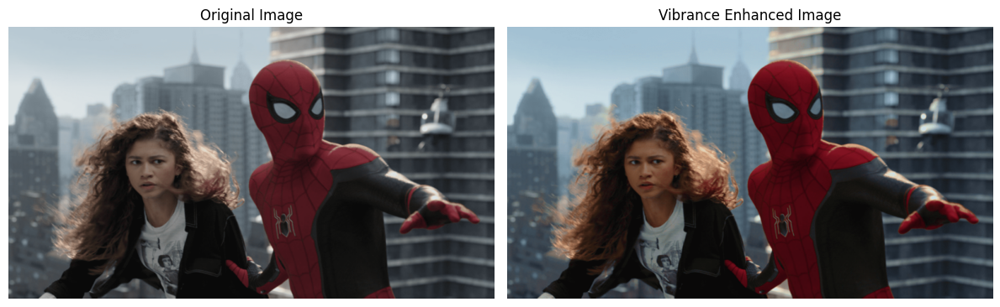

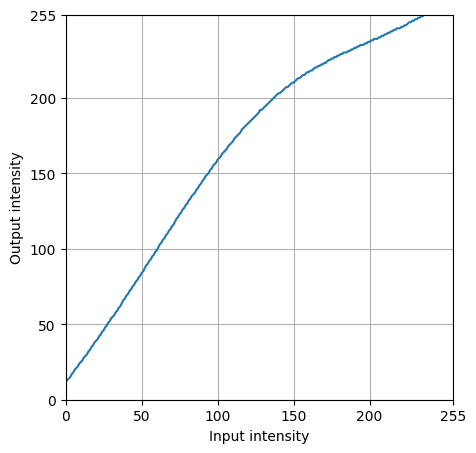

In [334]:
# Plot the final visually pleasing output

a = 0.5
sigma = 70

x = np.arange(0, 256)
f = np.minimum(x + a * 128 * np.exp(-((x - 128)**2) / (2 * sigma**2)), 255).astype('uint8')
s_enhanced = f[s]
spider_hsv_enhanced = cv.merge((h, s_enhanced, v))

# Convert back to BGR color space
spider_enhanced = cv.cvtColor(spider_hsv_enhanced, cv.COLOR_HSV2RGB)

# Plot Original vs Enhanced Image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(spider_rgb)
ax[0].set_title('Original Image')
ax[1].imshow(spider_enhanced)
ax[1].set_title('Vibrance Enhanced Image')
for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(5, 5))
plt.plot(f)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.xticks([0, 50, 100, 150, 200, 255])
plt.ylim(0, 255)
plt.yticks([0, 50, 100, 150, 200, 255])
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()

### Q5

In [335]:
# Load the image
shell = cv.imread('a1images/shells.tif', cv.IMREAD_GRAYSCALE)
assert shell is not None

In [336]:
# Define custom Histogram equalization function
def Hist_equal(r):
    L = 256
    M, N = r.shape

    hist, bin = np.histogram(r, L, [0, L])
    cdf = hist.cumsum()

    s = np.array([((L-1)/(M*N))*cdf[k] for k in range(256)]).astype("uint8")
    return s[r]

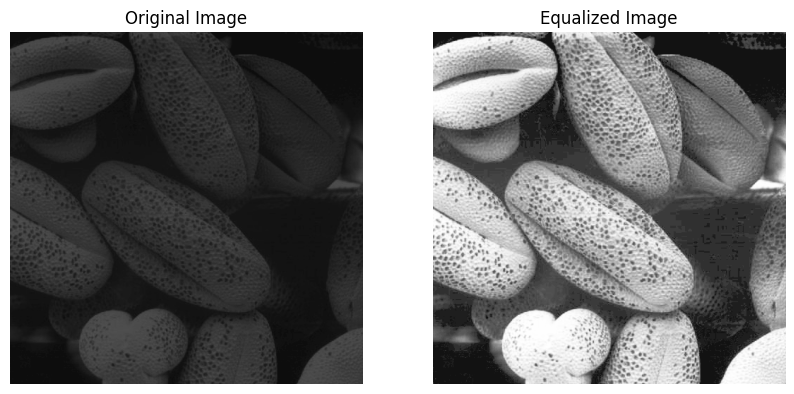

In [337]:
# Implement the Histogram Equalization
shell_equalized = Hist_equal(shell)

# Plot the original and equalized images
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(shell, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Image')
ax[1].imshow(shell_equalized, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Equalized Image')
for a in ax:
    a.axis('off')
plt.show()

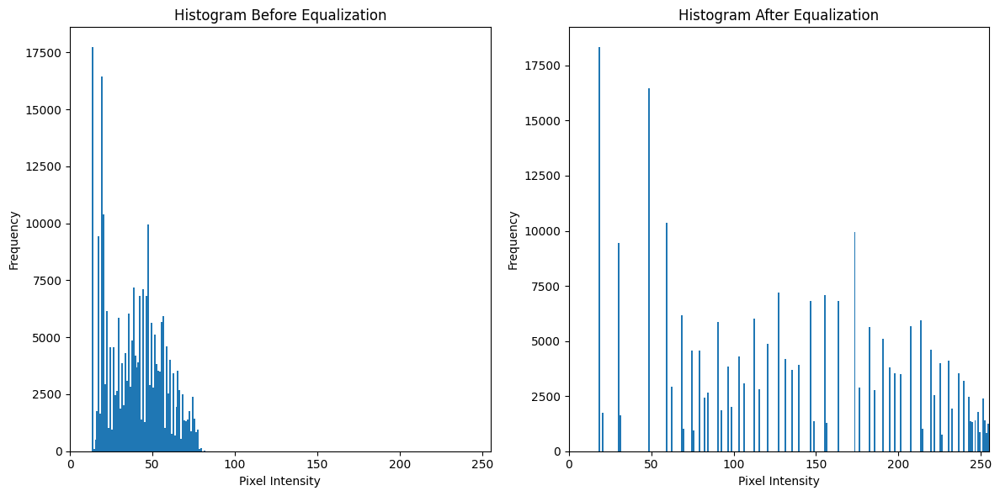

In [338]:
# Histogram of the original image
shell_hist, shell_bins = np.histogram(shell.ravel(), 256, [0, 256])
# Histogram of the equalized image
shell_equalized_hist, shell_equalized_bins = np.histogram(shell_equalized.ravel(), 256, [0, 256])

shell_bin_centers = (shell_bins[:-1] + shell_bins[1:]) / 2

plt.figure(figsize=(12, 6))

# Original histogram
plt.subplot(1, 2, 1)
plt.bar(shell_bin_centers, shell_hist, width=1.0)
plt.title("Histogram Before Equalization")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.xlim(0, 255)

# Equalized histogram
plt.subplot(1, 2, 2)
plt.bar(shell_bin_centers, shell_equalized_hist, width=1.0)
plt.title("Histogram After Equalization")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.xlim(0, 255)

plt.tight_layout()
plt.show()

### Q6

In [339]:
# Load the image
jlaw = cv.imread('a1images/jeniffer.jpg')
assert jlaw is not None

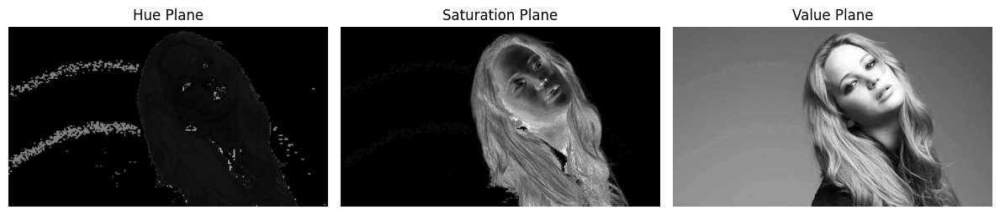

In [340]:
# Convert to HSV color space
jlaw_hsv = cv.cvtColor(jlaw, cv.COLOR_BGR2HSV)
# Split the HSV planes
h, s, v = cv.split(jlaw_hsv)

# Display the HSV channels
fig, ax = plt.subplots(1, 3, figsize=(12, 6))
ax[0].imshow(h, cmap='grey', vmin=0, vmax=255)
ax[0].set_title('Hue Plane')
ax[1].imshow(s, cmap='grey', vmin=0, vmax=255)
ax[1].set_title('Saturation Plane')
ax[2].imshow(v, cmap='grey', vmin=0, vmax=255)
ax[2].set_title('Value Plane')
for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()

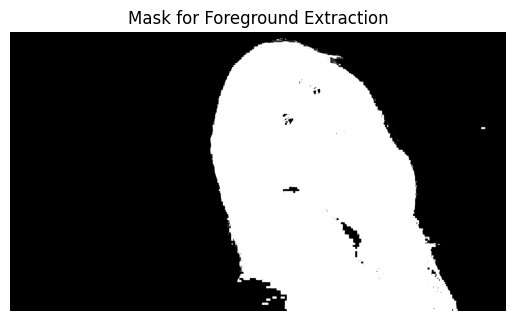

In [341]:
# Setting the threshold
ret, mask = cv.threshold(s, 12, 255, cv.THRESH_BINARY)

# Display the mask
plt.imshow(mask, cmap='gray')
plt.title('Mask for Foreground Extraction')
plt.axis('off')
plt.show()

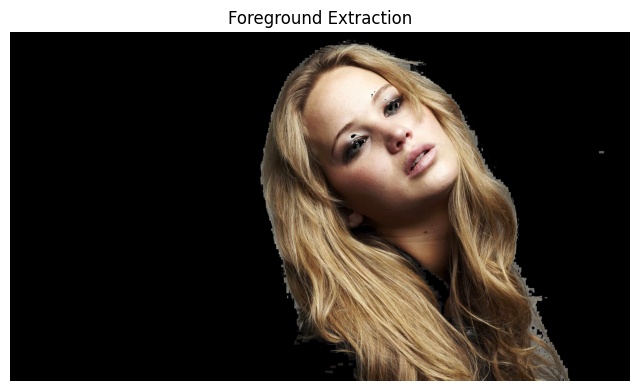

In [342]:
# Extract the foreground using the mask
foreground = cv.bitwise_and(jlaw, jlaw, mask=mask)

plt.figure(figsize=(8, 6))
plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.title('Foreground Extraction')
plt.axis('off')
plt.show()

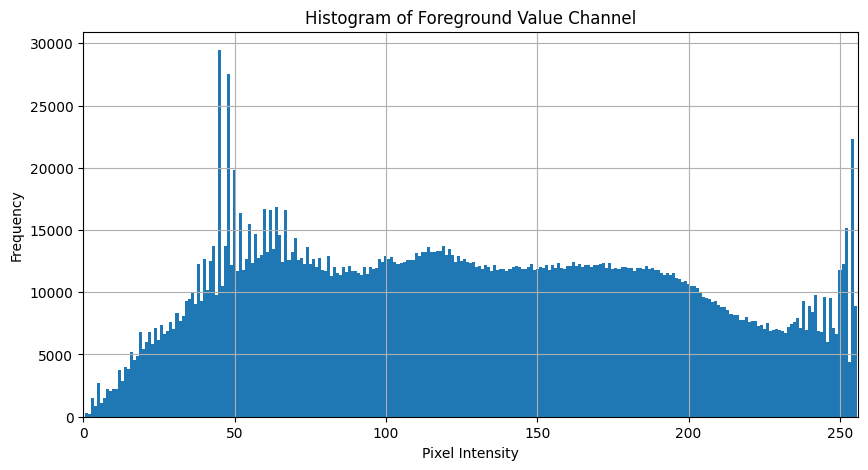

In [343]:
# Convert to HSV color space
foreground_hsv = cv.cvtColor(foreground, cv.COLOR_BGR2HSV)
# Split the HSV planes
hfg, sfg, vfg = cv.split(foreground_hsv)

# Compute the histogram of foreground
vfg_hist = cv.calcHist([vfg], [0], mask, [256], [0, 256])

x_values = np.arange(256)

plt.figure(figsize=(10, 5))
plt.bar(x_values, vfg_hist.flatten(), width=1.0)
plt.title('Histogram of Foreground Value Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])
plt.grid(True)
plt.show()

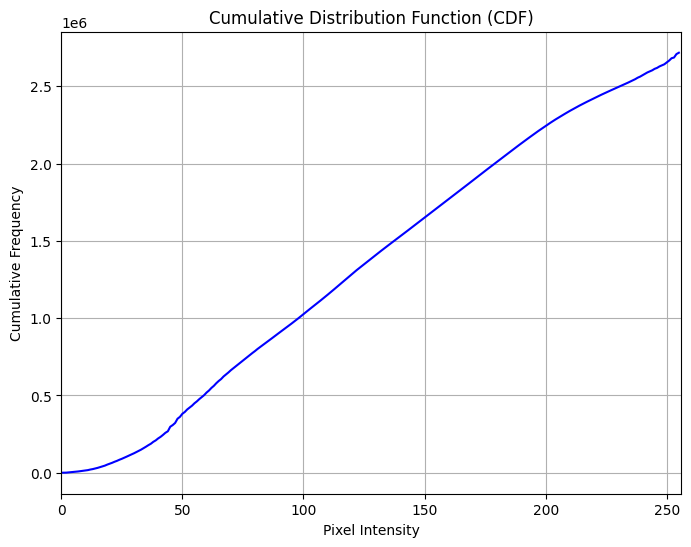

In [344]:
# Calculate the cdf
cdf = vfg_hist.cumsum()

# Plot the cdf
plt.figure(figsize=(8, 6))
plt.plot(x_values, cdf, color='blue')
plt.title('Cumulative Distribution Function (CDF)') 
plt.xlabel('Pixel Intensity')
plt.ylabel('Cumulative Frequency')
plt.xlim([0, 256])
plt.grid(True)
plt.show()

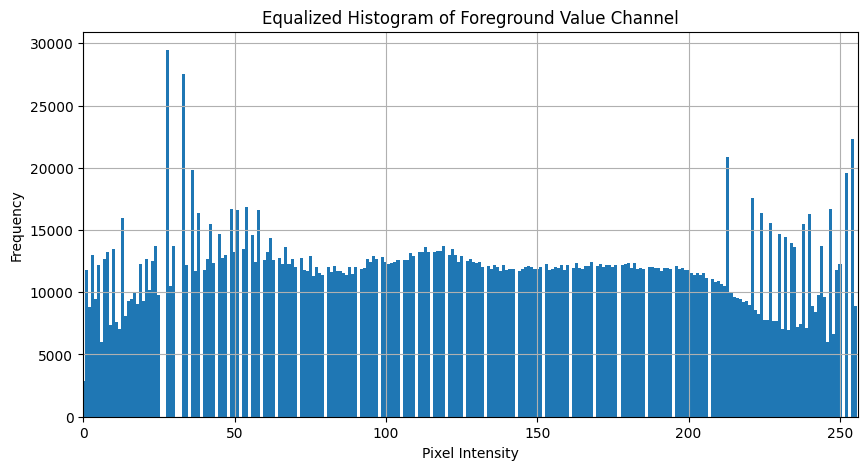

In [345]:
# Using formula given in slides for equalization
vfg_eq = cv.equalizeHist(vfg)

# Compute the histogram of foreground
vfg_hist_eq = cv.calcHist([vfg_eq], [0], mask, [256], [0, 256])

x_values = np.arange(256)

plt.figure(figsize=(10, 5))
plt.bar(x_values, vfg_hist_eq.flatten(), width=1.0)
plt.title('Equalized Histogram of Foreground Value Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])
plt.grid(True)
plt.show()


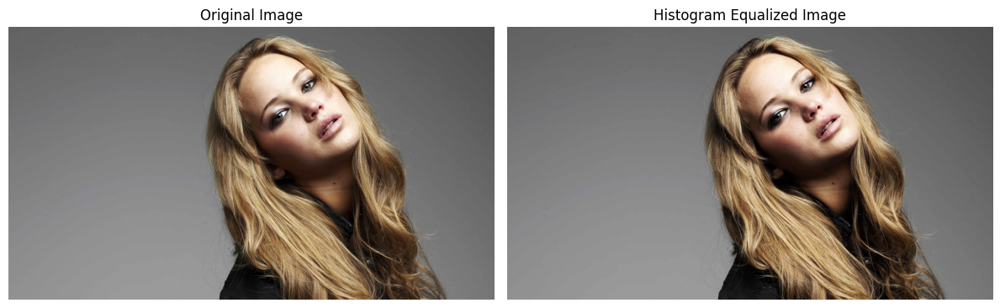

In [346]:
foreground_merged = cv.merge((hfg, sfg, vfg_eq))

foreground_final = cv.cvtColor(foreground_merged, cv.COLOR_HSV2RGB)

# Extract the Background
background = cv.bitwise_and(jlaw, jlaw, mask=~mask)

# Merge Equalized Foreground and Background
final_jlaw = cv.add(foreground_final, cv.cvtColor(background, cv.COLOR_BGR2RGB))

# Display the Original Image and Final Result
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(cv.cvtColor(jlaw, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(final_jlaw)
ax[1].set_title('Histogram Equalized Image')
ax[1].axis('off')

plt.tight_layout()  
plt.show()

### Q7

In [347]:
# Load the image
einstein = cv.imread('a1images/einstein.png', cv.IMREAD_GRAYSCALE)
assert einstein is not None

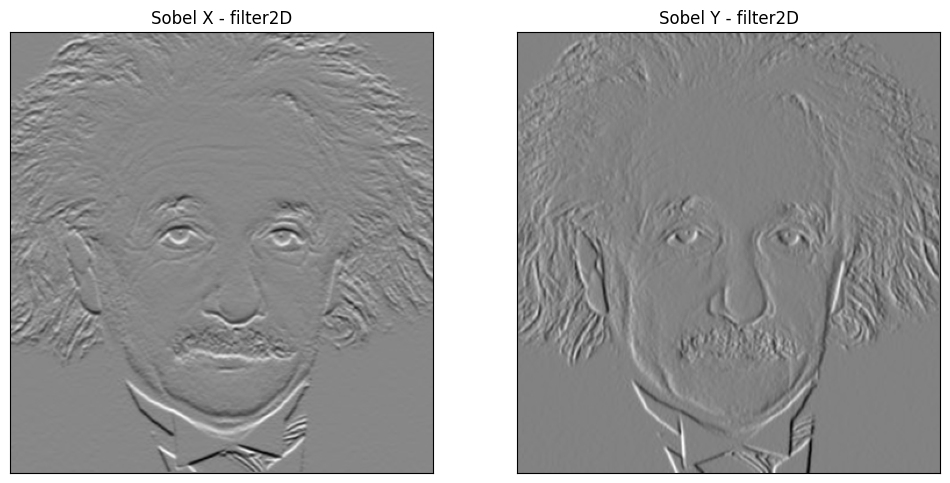

In [348]:
# Sobel Filtering using filter2D
sobel_x = np.array([[-1, -2, -1], 
                    [0, 0, 0], 
                    [1, 2, 1]])

sobel_y = np.array([[-1, 0, 1], 
                    [-2, 0, 2], 
                    [-1, 0, 1]])

einstein_x = cv.filter2D(einstein, cv.CV_64F, sobel_x)
einstein_y = cv.filter2D(einstein, cv.CV_64F, sobel_y)

fig, ax  = plt.subplots(1,2, sharex='all', sharey='all', figsize=(12,6))
ax[0].imshow(einstein_x, cmap='gray')
ax[0].set_title('Sobel X - filter2D')
ax[0].set_xticks([]), ax[0].set_yticks([])
ax[1].imshow(einstein_y, cmap='gray')
ax[1].set_title('Sobel Y - filter2D')
ax[1].set_xticks([]), ax[1].set_yticks([])
plt.show()

In [349]:
def sobel_filter(image):
    # Custom function to achieve sobel filtering
    
    sobel_x = np.array([[-1, -2, -1], 
                    [0, 0, 0], 
                    [1, 2, 1]])

    sobel_y = np.array([[-1, 0, 1], 
                    [-2, 0, 2], 
                    [-1, 0, 1]])
    
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    # Image dimensions
    rows, cols = image.shape
    # Pad image with zeros
    padded = np.pad(image, ((1, 1), (1, 1)), mode='constant', constant_values=0)

    # Prepare empty arrays for results
    gx = np.zeros_like(image, dtype=float)
    gy = np.zeros_like(image, dtype=float)

    # 2D Convolution
    for i in range(image.shape[0]):       
        for j in range(image.shape[1]):   
            region = padded[i:i+3, j:j+3]
            gx[i, j] = np.sum(region * sobel_x)
            gy[i, j] = np.sum(region * sobel_y)
    return gx, gy


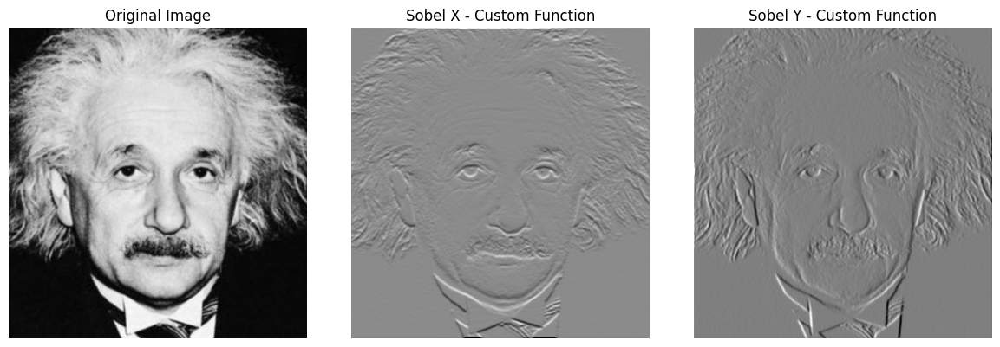

In [350]:
# Sobel Filtering using custom function
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(einstein, cmap='gray')
ax[0].set_title('Original Image')
ax[1].imshow(sobel_filter(einstein)[0], cmap='gray')
ax[1].set_title('Sobel X - Custom Function')
ax[2].imshow(sobel_filter(einstein)[1], cmap='gray')
ax[2].set_title('Sobel Y - Custom Function')
for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()

In [351]:
# vertical sobel seperation
sobel_x1 = np.array([[-1], [0], [1]])
sobel_x2 = np.array([[1, 2, 1]])

# horizontal sobel separation
sobel_y1 = np.array([[-1], [-2], [-1]])
sobel_y2 = np.array([[1, 0, -1]])

# Implement Sobel filtering
einstein_x1 = cv.filter2D(einstein, cv.CV_64F, sobel_x1)
einstein_x  = cv.filter2D(einstein_x1, cv.CV_64F, sobel_x2)
einstein_y1 = cv.filter2D(einstein, cv.CV_64F, sobel_y2)
einstein_y  = cv.filter2D(einstein_y1, cv.CV_64F, sobel_y1)


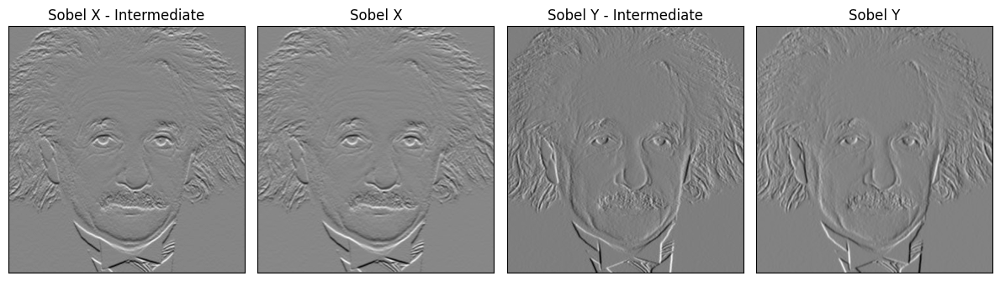

In [352]:
# Plot the Images
fig, ax  = plt.subplots(1,4, sharex='all', sharey='all', figsize=(12,6))
ax[0].imshow(einstein_x1, cmap='gray')
ax[0].set_title('Sobel X - Intermediate')
ax[0].set_xticks([]), ax[0].set_yticks([])
ax[1].imshow(einstein_x, cmap='gray')
ax[1].set_title('Sobel X')
ax[1].set_xticks([]), ax[1].set_yticks([])
ax[2].imshow(einstein_y1, cmap='gray')
ax[2].set_title('Sobel Y - Intermediate')
ax[2].set_xticks([]), ax[2].set_yticks([])
ax[3].imshow(einstein_y, cmap='gray')
ax[3].set_title('Sobel Y')
ax[3].set_xticks([]), ax[3].set_yticks([])
plt.tight_layout()
plt.show()

### Q8

In [353]:
def zoom_img(img, method, scale):
    # function to zoom images using different interpolation methods
    if not (0 < scale <= 10):
        raise ValueError("Scale must be between 0 and 10")
    
    if method == 'nearest':
        return cv.resize(
            img, 
            None, 
            fx=scale, 
            fy=scale, 
            interpolation=cv.INTER_NEAREST)
    elif method == 'bilinear':
        return cv.resize(
            img, 
            None, 
            fx=scale, 
            fy=scale, 
            interpolation=cv.INTER_LINEAR)
    

def test_normalizeSSD(original, output):
    # Check the normalized sum of squared differences (SSD) between two images

    if original.shape != output.shape:
        raise ValueError("Images dimensions are not equal")
    return np.sum((original - output)**2) / original.size

### Image 1

In [354]:
# Load the Image
img1 = cv.imread('a1images/a1q5images/im01.png')
assert img1 is not None
img1_small = cv.imread('a1images/a1q5images/im01small.png')
assert img1_small is not None

In [355]:
img1_zoomed_nearest = zoom_img(img1_small, method='nearest', scale=4)
nearest_SSD = test_normalizeSSD(img1, img1_zoomed_nearest)
print('Normalized SSD for Nearest Neighbour method: ', nearest_SSD)

img1_zoomed_bilinear = zoom_img(img1_small, method='bilinear', scale=4)
bilinear_SSD = test_normalizeSSD(img1, img1_zoomed_bilinear)
print('Normalized SSD for Bilinear method: ', bilinear_SSD)

Normalized SSD for Nearest Neighbour method:  31.284316486625514
Normalized SSD for Bilinear method:  31.053094618055557


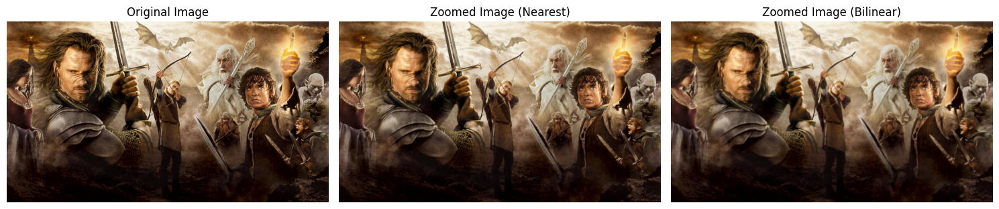

In [356]:
# Display the Images
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[1].imshow(cv.cvtColor(img1_zoomed_nearest, cv.COLOR_BGR2RGB))
ax[1].set_title('Zoomed Image (Nearest)')
ax[2].imshow(cv.cvtColor(img1_zoomed_bilinear, cv.COLOR_BGR2RGB))
ax[2].set_title('Zoomed Image (Bilinear)')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

### Image 2

In [357]:
# Load the Image
img2 = cv.imread('a1images/a1q5images/im02.png')
assert img2 is not None
img2_small = cv.imread('a1images/a1q5images/im02small.png')
assert img2_small is not None

In [358]:
img2_zoomed_nearest = zoom_img(img2_small, method='nearest', scale=4)
nearest_SSD = test_normalizeSSD(img2, img2_zoomed_nearest)
print('Normalized SSD for Nearest Neighbour method: ', nearest_SSD)

img2_zoomed_bilinear = zoom_img(img2_small, method='bilinear', scale=4)
bilinear_SSD = test_normalizeSSD(img2, img2_zoomed_bilinear)
print('Normalized SSD for Bilinear method: ', bilinear_SSD)

Normalized SSD for Nearest Neighbour method:  11.902013310185184
Normalized SSD for Bilinear method:  10.682991753472223


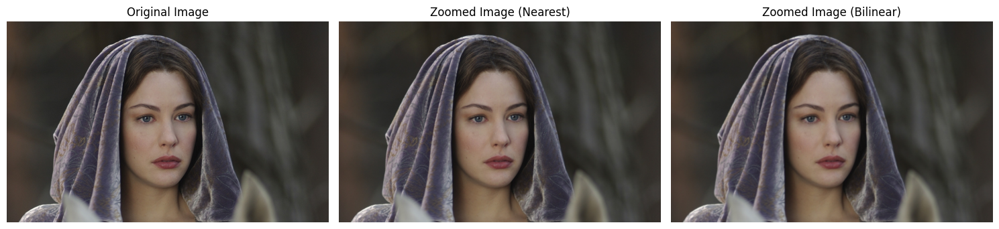

In [359]:
# Display the Images
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[1].imshow(cv.cvtColor(img2_zoomed_nearest, cv.COLOR_BGR2RGB))
ax[1].set_title('Zoomed Image (Nearest)')
ax[2].imshow(cv.cvtColor(img2_zoomed_bilinear, cv.COLOR_BGR2RGB))
ax[2].set_title('Zoomed Image (Bilinear)')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

### Image 3

In [360]:
# Load the Image
img3 = cv.imread('a1images/a1q5images/im03.png')
assert img3 is not None
img3_small = cv.imread('a1images/a1q5images/im03small.png')
assert img3_small is not None

In [361]:
img3_zoomed_nearest = zoom_img(img3_small, method='nearest', scale=4)
img3_zoomed_bilinear = zoom_img(img3_small, method='bilinear', scale=4)

print(img3.shape, img3_zoomed_nearest.shape)

(1459, 2400, 3) (1460, 2400, 3)


In [362]:
# Cannot use because the shapes are not matching

# nearest_SSD = test_normalizeSSD(img3, img3_zoomed_nearest)
# print('Normalized SSD for Nearest Neighbour method: ', nearest_SSD)

# bilinear_SSD = test_normalizeSSD(img3, img3_zoomed_bilinear)
# print('Normalized SSD for Bilinear method: ', bilinear_SSD)

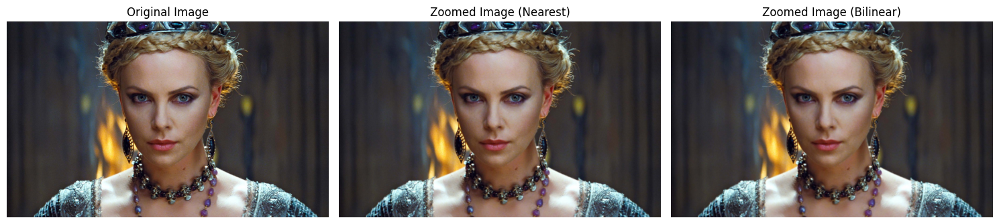

In [363]:
# Display the Images
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[1].imshow(cv.cvtColor(img3_zoomed_nearest, cv.COLOR_BGR2RGB))
ax[1].set_title('Zoomed Image (Nearest)')
ax[2].imshow(cv.cvtColor(img3_zoomed_bilinear, cv.COLOR_BGR2RGB))
ax[2].set_title('Zoomed Image (Bilinear)')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

### Image 4

In [364]:
# Load the Image
img4 = cv.imread('a1images/a1q5images/taylor.jpg')
assert img4 is not None
img4_small = cv.imread('a1images/a1q5images/taylor_small.jpg')
assert img4_small is not None
img4_very_small = cv.imread('a1images/a1q5images/taylor_very_small.jpg')
assert img4_very_small is not None

In [365]:
img4_zoomed_nearest = zoom_img(img4_small, method='nearest', scale=8)
img4_zoomed_bilinear = zoom_img(img4_small, method='bilinear', scale=8)

print(img4.shape, img4_zoomed_nearest.shape)

# Cannot use because the shapes are not matching
# nearest_SSD = test_normalizeSSD(img4, img4_zoomed_nearest)
# print('Normalized SSD for Nearest Neighbour method: ', nearest_SSD)

# bilinear_SSD = test_normalizeSSD(img4, img4_zoomed_bilinear)
# print('Normalized SSD for Bilinear method: ', bilinear_SSD)

(560, 1000, 3) (896, 1600, 3)


In [366]:
img4_more_zoomed_nearest = zoom_img(img4_very_small, method='nearest', scale=10)
img4_more_zoomed_bilinear = zoom_img(img4_very_small, method='bilinear', scale=10)

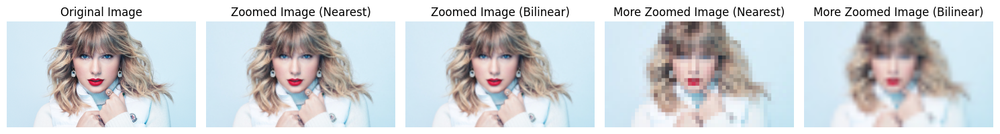

In [367]:
# Display the Images
fig, ax = plt.subplots(1, 5, figsize=(15, 5))
ax[0].imshow(cv.cvtColor(img4, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[1].imshow(cv.cvtColor(img4_zoomed_nearest, cv.COLOR_BGR2RGB))
ax[1].set_title('Zoomed Image (Nearest)')
ax[2].imshow(cv.cvtColor(img4_zoomed_bilinear, cv.COLOR_BGR2RGB))
ax[2].set_title('Zoomed Image (Bilinear)')
ax[3].imshow(cv.cvtColor(img4_more_zoomed_nearest, cv.COLOR_BGR2RGB))
ax[3].set_title('More Zoomed Image (Nearest)')
ax[4].imshow(cv.cvtColor(img4_more_zoomed_bilinear, cv.COLOR_BGR2RGB))
ax[4].set_title('More Zoomed Image (Bilinear)')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

### Q9

In [368]:
# Load the Image
flower = cv.imread('a1images/daisy.jpg')
assert flower is not None

print(flower.shape[:2])

(841, 561)


In [369]:
# Extracting the foreground object
mask = np.zeros(flower.shape[:2], np.uint8)

h, w = flower.shape[:2]
rect = (50, 100, 560, 500)

bgdModel = np.zeros((1, 65), np.float64)  # background model
fgdModel = np.zeros((1, 65), np.float64)  # foreground model

# Initialize GrabCut with rectangle
cv.grabCut(flower, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

# Extract foreground
foreground = flower * mask2[:, :, np.newaxis]

# Extract background
mask_bg = 1 - mask2
background = flower * mask_bg[:, :, np.newaxis]

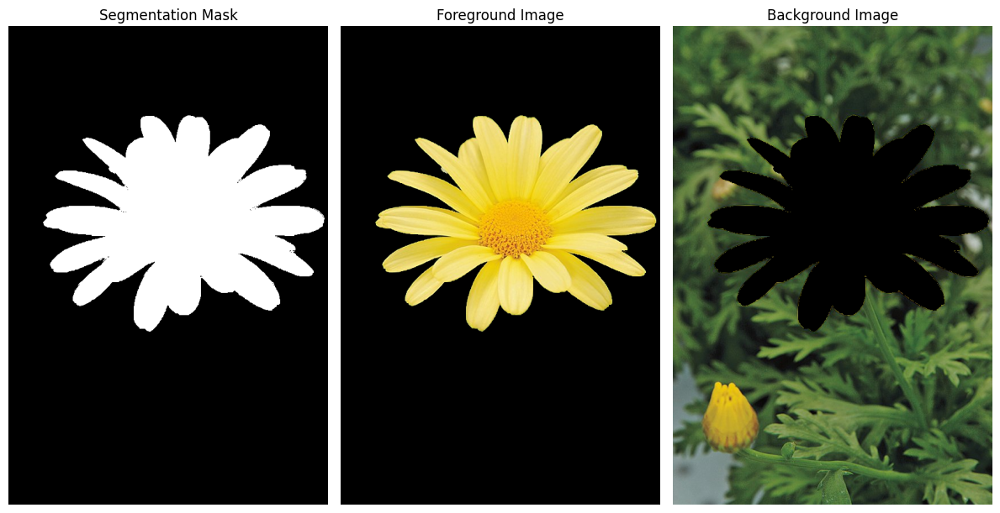

In [370]:
# Show the results
fig, ax = plt.subplots(1, 3, figsize=(12, 6))

ax[0].imshow(mask2, cmap='gray')
ax[0].set_title('Segmentation Mask')
ax[0].axis('off')

ax[1].imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
ax[1].set_title('Foreground Image')
ax[1].axis('off')

ax[2].imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
ax[2].set_title('Background Image')
ax[2].axis('off')

plt.tight_layout()
plt.show()

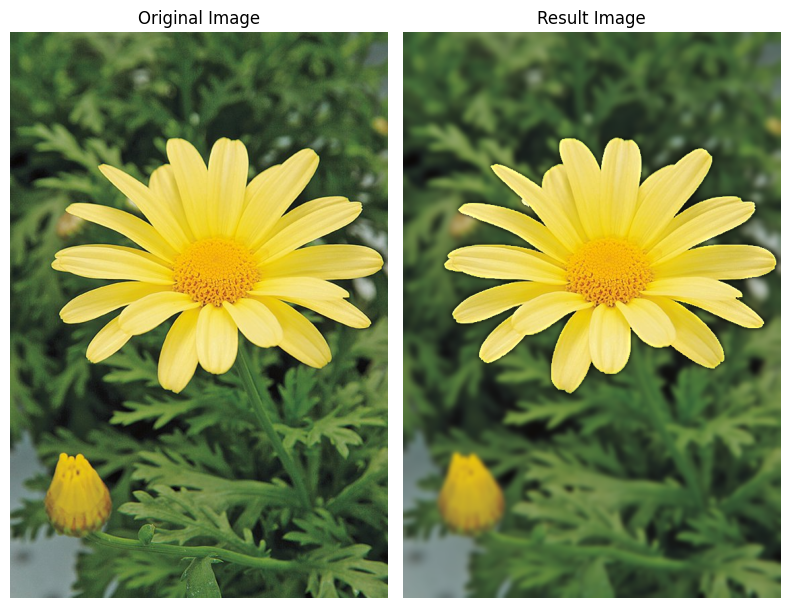

In [371]:
# Blur the background
background_blurred = cv.GaussianBlur(background, (19, 19), 0)

# Combine blurred background with original foreground
result_image = cv.add(foreground, background_blurred)

# Display the final result with Original Image
fig, ax = plt.subplots(1, 2, figsize=(8, 6))
ax[0].imshow(cv.cvtColor(flower, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[1].imshow(cv.cvtColor(result_image, cv.COLOR_BGR2RGB))
ax[1].set_title('Result Image')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()